In [12]:
import pandas as pd
import mysql.connector 
from credentials import *
import ydata_profiling as pp
import seaborn as sns
import matplotlib.pyplot as plt

# set the maximum number of columns to be displayed
pd.set_option('display.max_columns', None)

In [25]:
### Short Data Dictonary - Tables - LCED_2_analysis - MySQL
# STG_CUSTOMER: Customer data 94k
# STG_CP_DIST: District Data 733
# STG_PRODUCT: Product Data 166K
# STG_TRX_ALL: All Transaction Data
# STG_TRX_SPL : Sample Transaction Data
### Short Data Dictonary - Tables - LCED_2_raw - MySQL
# AAI_Trx_sample: Sample Transaction Data
# AAI_dim_customer: Customer data
# AAI_dim_product: Product Data
# AAI_dim_district: Location Data


In [2]:
def connect2DB():
    try:
        cnx = mysql.connector.connect(user=username, password=password,
                              host='193.136.29.19',
                              port = '21022',
                              database='LCED_2_raw')
        cursor = cnx.cursor()
        cursor.execute("SELECT DATABASE()")
        print("Connection to MySQL established.")
        print(f'Connected to {cursor.fetchone()}')
    
    except mysql.Error as e:
        print(f"Error connecting to MySQL Platform: {e}")

    cnx.close()

    return cnx

cnx = connect2DB()  #Currently using CSV files from Moodle

'''
# Connect to the database
cnx = mysql.connector.connect(user=username, password=password,
                              host='193.136.29.19',
                              port = '21022',
                              database='LCED_2_analysis')

#cnx.close()
cur = cnx.cursor(buffered=True)
cur.execute("""SELECT * FROM STG_CP_DIST""")
# get columns names
columns = [desc[0] for desc in cur.description]
df_test = cur.fetchall()
df_test = pd.DataFrame(df_test, columns=columns)
cur.close()
'''

Connection to MySQL established.
Connected to ('LCED_2_raw',)


'\n# Connect to the database\ncnx = mysql.connector.connect(user=username, password=password,\n                              host=\'193.136.29.19\',\n                              port = \'21022\',\n                              database=\'LCED_2_analysis\')\n\n#cnx.close()\ncur = cnx.cursor(buffered=True)\ncur.execute("""SELECT * FROM STG_CP_DIST""")\n# get columns names\ncolumns = [desc[0] for desc in cur.description]\ndf_test = cur.fetchall()\ndf_test = pd.DataFrame(df_test, columns=columns)\ncur.close()\n'

In [3]:
customer = pd.read_csv('AAI_dim_customer.csv',encoding='iso-8859-1')
product = pd.read_csv('AAI_dim_product.csv',encoding='iso-8859-1')
location = pd.read_csv('AAI_dim_location.csv',encoding='iso-8859-1')
transaction = pd.read_csv('AAI_Trx_small_sample.csv',encoding='iso-8859-1')

In [4]:
#Check the data
pp.ProfileReport(customer)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
pp.ProfileReport(product)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
pp.ProfileReport(location)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
pp.ProfileReport(transaction)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [31]:
"""customer (CUSTOMER_ACCOUNT_NR_MASK) - sample (CUSTOMER_ACCOUNT_NR_MASK)
product (SKU) - sample (SKU)"""
# merge 3 dfs
df_merge = transaction.merge(customer, on='CUSTOMER_ACCOUNT_NR_MASK').merge(product, on='SKU').merge(location, on='LOCATION_CD')

In [32]:
df_merge.isnull().sum()

TIME_KEY                      0
TRANSACTION_ID_MASK           0
CUSTOMER_ACCOUNT_NR_MASK      2
LOC_BRAND_CD_x                0
LOCATION_CD                   0
POS_TP_CD                     0
SKU                           0
PRODUCT_KEY                   0
QTY                           0
NET_SLS_AMT                   0
GROSS_SLS_AMT                 0
PROD_DSCNT_ISSUED_AMT         0
TRANS_DSCNT_RAT_AMT           0
DIRECT_DSCNT_AMT              0
GENDER                      234
FAMILY_MEMBERS              889
CP4                         267
seg_lifestyle_cd              0
seg_lifestyle_dsc             0
SEG_AGE                       0
SEG_AGE_DSC                   0
seg_lifestage_cd              0
seg_lifestage_dsc             0
PRODUCT_DSC                   0
UNIT_BASE_CD_EXT              0
UNIT_BASE_DSC_EXT             0
SUBCAT_CD_EXT                 0
SUBCAT_DSC_EXT                0
CAT_CD_EXT                    0
CAT_DSC_EXT                   0
BIZ_UNIT_CD_EXT               0
BIZ_UNIT

<AxesSubplot:xlabel='PRICE_RANGE', ylabel='Count'>

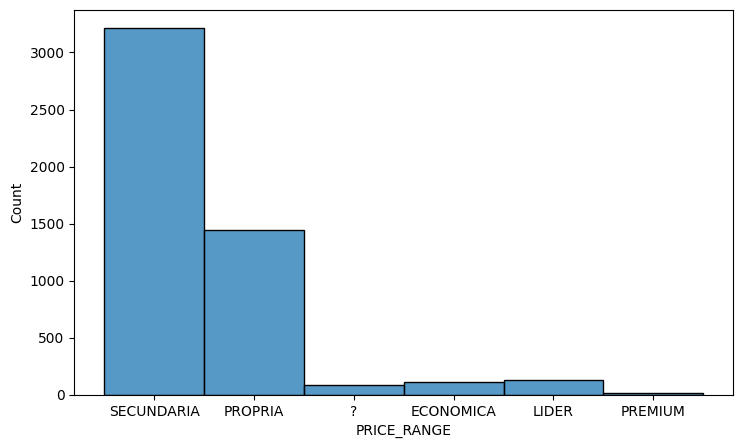

In [10]:
fig, axes = plt.subplots(figsize=(8.5,5), ncols=1, sharey=True)
sns.histplot(data=df_merge.PRICE_RANGE, binwidth=3)

In [33]:
df_merge

,TIME_KEY,TRANSACTION_ID_MASK,CUSTOMER_ACCOUNT_NR_MASK,LOC_BRAND_CD_x,LOCATION_CD,POS_TP_CD,SKU,PRODUCT_KEY,QTY,NET_SLS_AMT,GROSS_SLS_AMT,PROD_DSCNT_ISSUED_AMT,TRANS_DSCNT_RAT_AMT,DIRECT_DSCNT_AMT,GENDER,FAMILY_MEMBERS,CP4,seg_lifestyle_cd,seg_lifestyle_dsc,SEG_AGE,SEG_AGE_DSC,seg_lifestage_cd,seg_lifestage_dsc,PRODUCT_DSC,UNIT_BASE_CD_EXT,UNIT_BASE_DSC_EXT,SUBCAT_CD_EXT,SUBCAT_DSC_EXT,CAT_CD_EXT,CAT_DSC_EXT,BIZ_UNIT_CD_EXT,BIZ_UNIT_DSC_EXT,DEPARTMENT_CD_EXT,DEPARTMENT_DSC_EXT,PRODUCT_SHORT_DSC,BRAND_DSC,BRAND_TYPE_CD,PRICE_RANGE,CONVERSION_FACTOR,CAPACITY_UNIT,LOCATION_DSC,LOC_BRAND_CD_y,LOC_BRAND_DSC,cp7
0,20220508,8866258034017223288,83625674.0,303,239,P,7330462,7330462010001,1.000,0.6423,0.79,0.0,0.079010,0,F,NaN,5300,1,Qualidade,SA_2,]18;25],5,Active Adults,BLOCO APONT A7 80F 60GR LISO NOTE!,33020224,33020224 - blocos,330202,330202 - cadernos e papel,3302,3302 - papelaria,33,33 - Cultura,23,23 - BAZAR,BLOCO APONT A7,NOTE!,MP,SECUNDARIA,1.00,UN,MDL BRAGANCA,303,continente modelo,5300
1,20221102,8756093530610753087,34858968.0,303,239,P,7368462,7368462010001,1.000,1.0163,1.25,0.0,0.000000,0,M,3.0,5300,2,Família,SA_5,]45;55],4,Family with Kids,GELATINA CONTINENTE MORANGO 6*100G,8041106,08041106 - Gelatinas Prontas,80411,080411 - sobremesas,804,0804 - iogurtes e sobrem.,8,08 - Laticínios/Beb. Veg.,10,10 - ALIMENTAR,GELATINA MORANG,CONT.POUPANCA,MP,SECUNDARIA,0.60,KG,MDL BRAGANCA,303,continente modelo,5300
2,20220912,8740982114387001912,34858968.0,303,239,P,3074985,3074985010001,1.000,0.7236,0.89,0.0,0.000000,0,M,3.0,5300,2,Família,SA_5,]45;55],4,Family with Kids,(I)ESPONJA BANHO CONTINENTE 3UN,5030601,05030601 - Outros Acess. Banho,50306,050306 - acessórios banho,503,0503 - higiene corporal,5,05 - Higiene,10,10 - ALIMENTAR,ESPONJA 3UN,CONTINENTE,MP,PROPRIA,3.00,UN,MDL BRAGANCA,303,continente modelo,5300
3,20220924,8751781497573067191,4444158.0,303,239,P,2076764,2076764010001,0.354,1.3302,1.41,0.0,0.000000,0,M,3.0,4650,2,Família,SA_5,]45;55],3,Family w/ Young Adul,COUVE BROCOLO CNT KG,15020402,15020402 - inflorescências,150204,150204 - couves,1502,1502 - legumes,15,15 - Frutas e Legumes,12,12 - F&L C&Q PAD TAWAY,COUVE BROCOLO,CONTINENTE,MP,PROPRIA,1.00,KG,MDL BRAGANCA,303,continente modelo,5300
4,20220926,8754005802439503257,12594189.0,303,239,P,5788581,5788581010001,2.000,1.3019,1.38,0.0,0.138024,0,F,4.0,5300,2,Família,SA_4,]35;45],4,Family with Kids,IOG AROMA CONTINENTE COCO 4*125G,8040103,08040103 - S.Trad. Aromas,80401,080401 - sólidos tradicionais,804,0804 - iogurtes e sobrem.,8,08 - Laticínios/Beb. Veg.,10,10 - ALIMENTAR,IOG AROMA COCO,CONTINENTE,MP,PROPRIA,0.50,KG,MDL BRAGANCA,303,continente modelo,5300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4994,20221230,9137231893782675554,50374079.0,302,4289,P,6574808,6574808010001,1.000,1.3740,1.69,0.0,0.804785,0,F,NaN,2625,1,Qualidade,SA_4,]35;45],3,Family w/ Young Adul,SALSICHAS CHURRASCO CONTINENTE 200G,13020702,13020702 - salsichas corr ls,130207,130207 - enchidos corr (ls),1302,1302 - Charcutaria,13,13 - Charcutaria&Queijos,12,12 - F&L C&Q PAD TAWAY,SALSICHAS CHURR,CONTINENTE,MP,SECUNDARIA,0.20,KG,CBD V REAL S ANTONIO,302,continente bom dia,8900
4995,20220912,8740982016873536173,75834880.0,302,4289,P,2907937,2907937010001,2.000,1.3982,1.58,0.0,0.000000,0,M,0.0,8950,1,Qualidade,SA_7,>65,2,Senior,EMPADAS GALINHA CG 80G,18010204,18010204 - empadas e empanadas,180102,180102 - Salgados,1801,1801 - TA Atendimento,18,18 - Take Away,12,12 - F&L C&Q PAD TAWAY,EMPADAS GALINHA,CONTINENTE AT,MP,SECUNDARIA,0.08,KG,CBD V REAL S ANTONIO,302,continente bom dia,8900
4996,20220905,8696755831545093671,50657468.0,302,4289,P,2433628,2433628010001,1.000,0.5285,0.65,0.0,0.097512,0,M,0.0,1700,1,Qualidade,SA_7,>65,2,Senior,FEIJAO BR.CONTINENTE 400G,1030302,01030302 - Feijão,10303,010303 - vegetais em conserva,103,0103 - conservas,1,01 - Mercearia Salgada,10,10 - AL